In [15]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import os
import pandas as pd

plt.style.use('default')

In [16]:
prices = np.arange(1, 11, 1)
capacities = np.arange(200, 2200, 200)

In [17]:
nr_islands = 5

df_percentages = pd.read_csv(f'Data{nr_islands}/percentages_ferry_users.csv')
df_mean = pd.read_csv(f'Data{nr_islands}/mean.csv')
df_CI = pd.read_csv(f'Data{nr_islands}/CI.csv')
df_mean_mean = pd.read_csv(f'Data{nr_islands}/mean_mean.csv')
df_CI_mean = pd.read_csv(f'Data{nr_islands}/CI_mean.csv')

# Get the original shapes
num_days = 100
num_prices = len(prices)
num_capacities = len(capacities)
runs = 15

# Reshape the data to their original shapes
percentages_ferry_users = df_percentages.values.reshape(num_capacities, num_prices, num_days, runs)
mean = df_mean.values.reshape(num_capacities, num_prices, num_days)
CI = df_CI.values.reshape(num_capacities, num_prices, num_days, 2)
mean_mean = df_mean_mean.values.reshape(num_capacities, num_prices)
CI_mean = df_CI_mean.values.reshape(num_capacities, num_prices, 2)

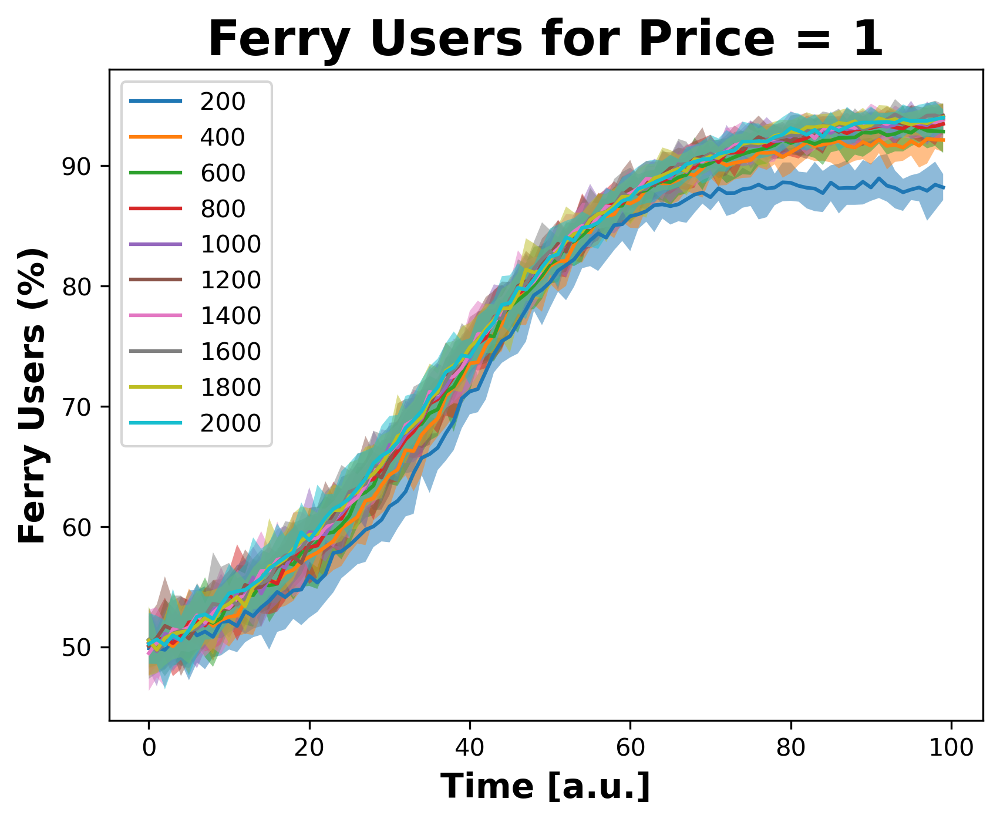

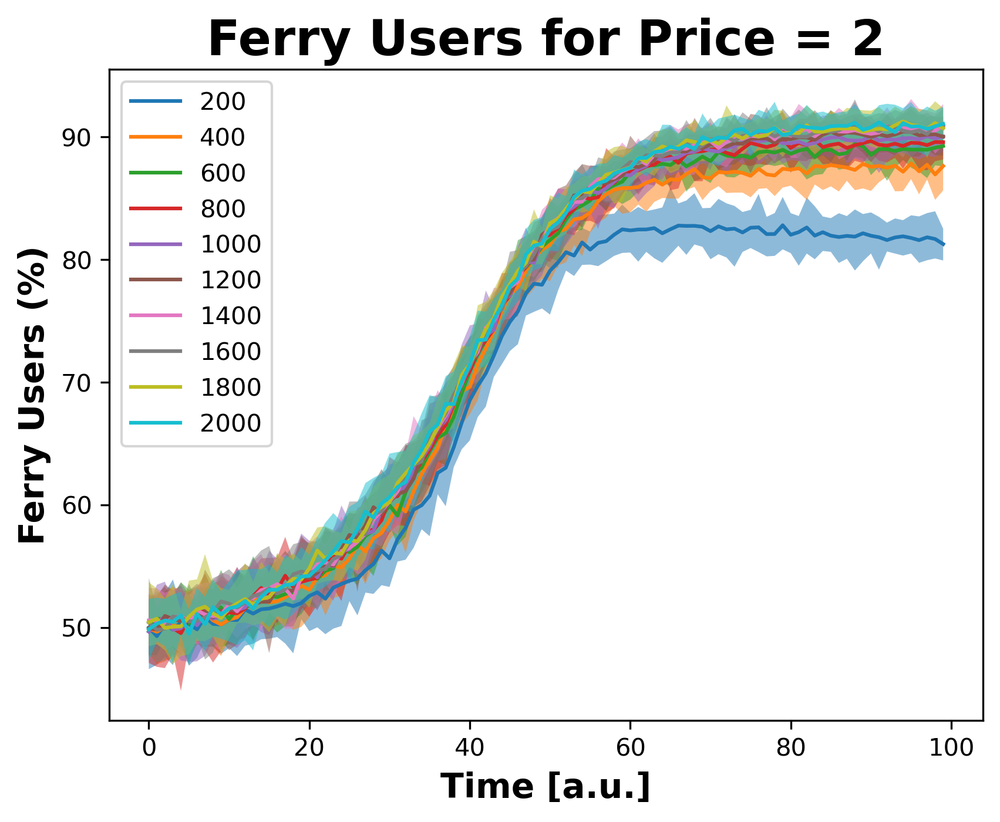

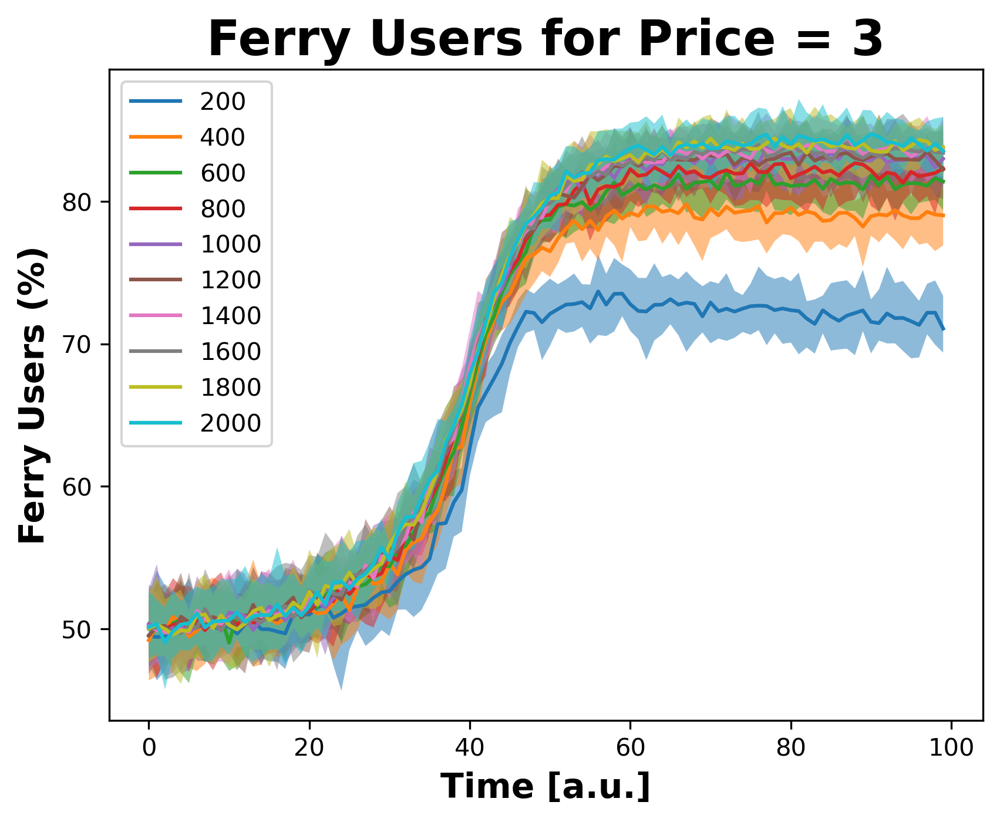

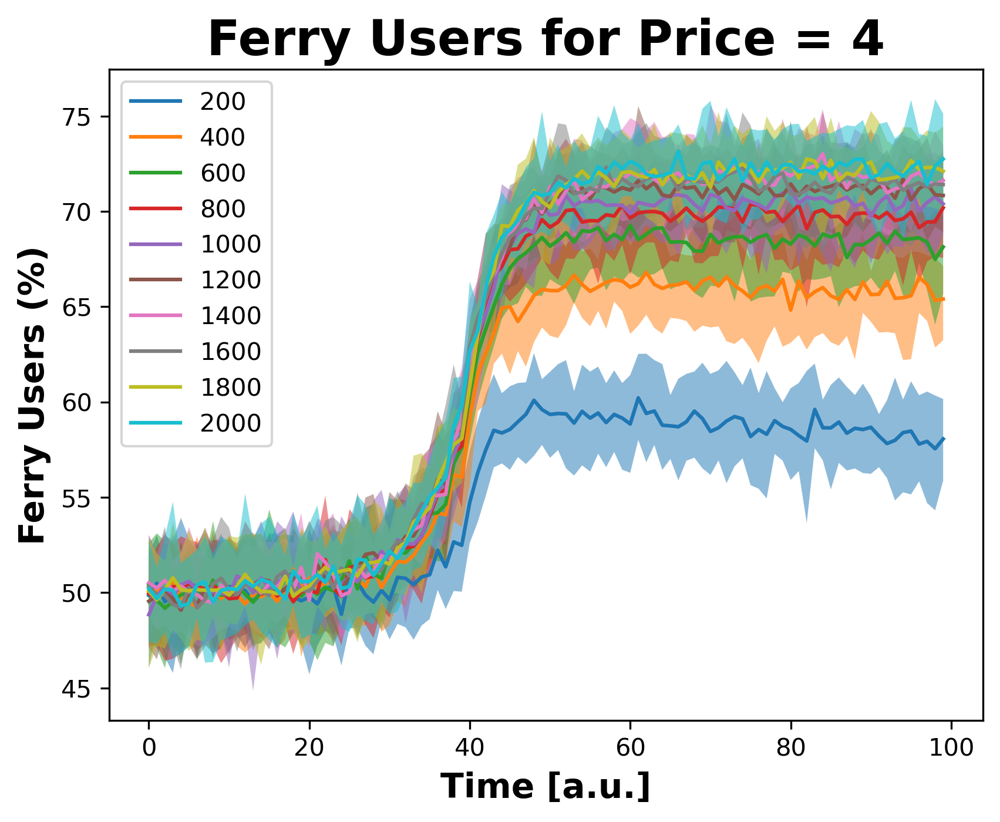

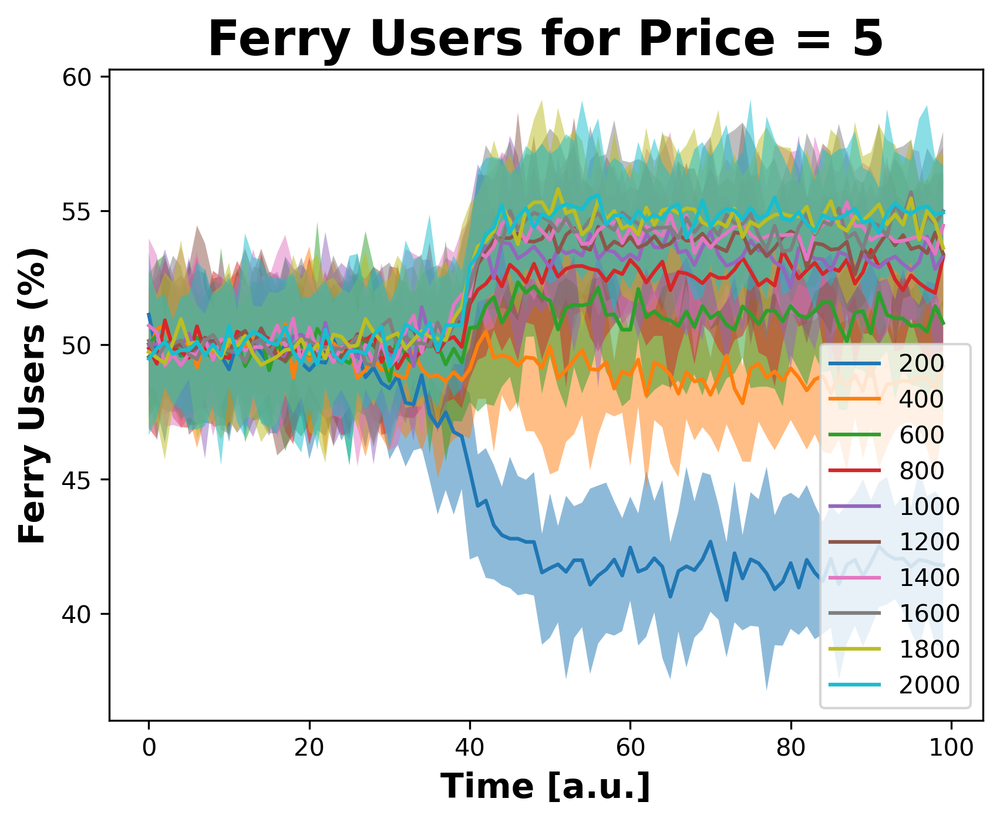

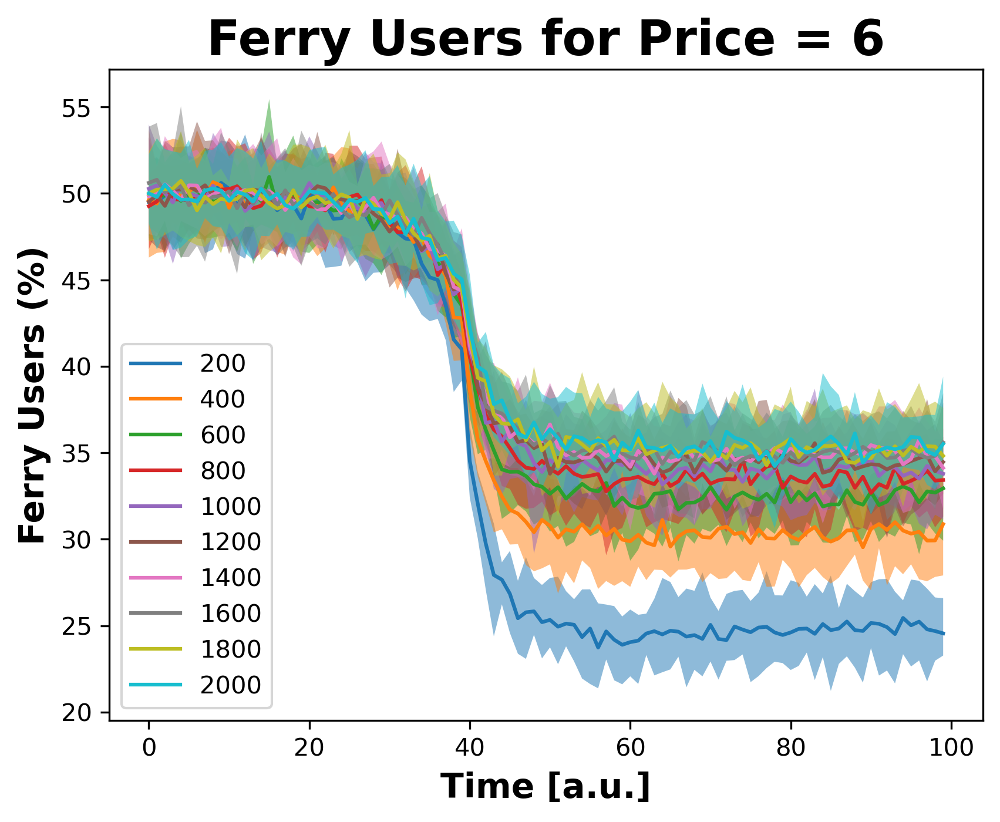

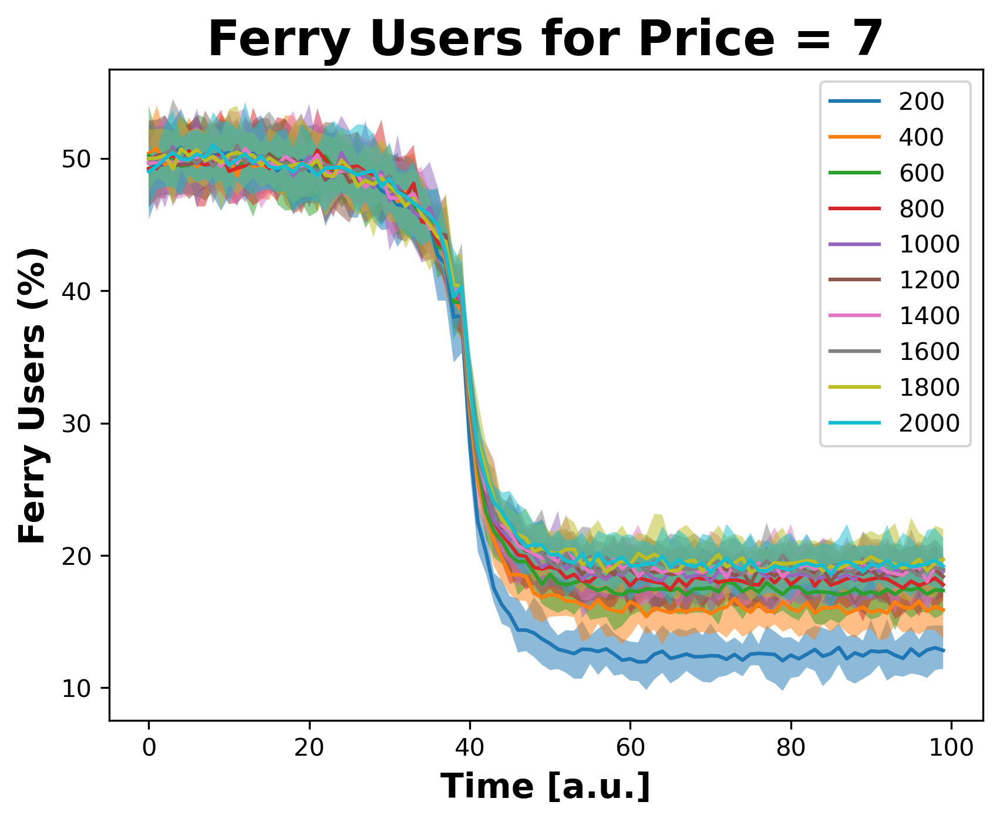

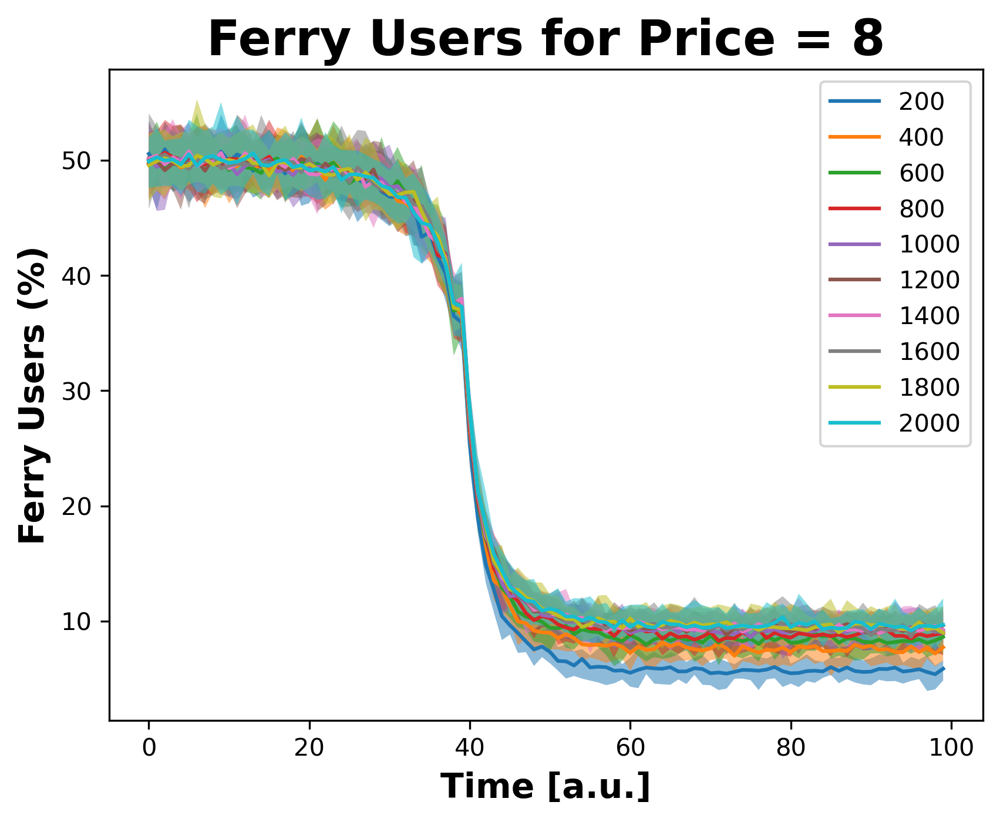

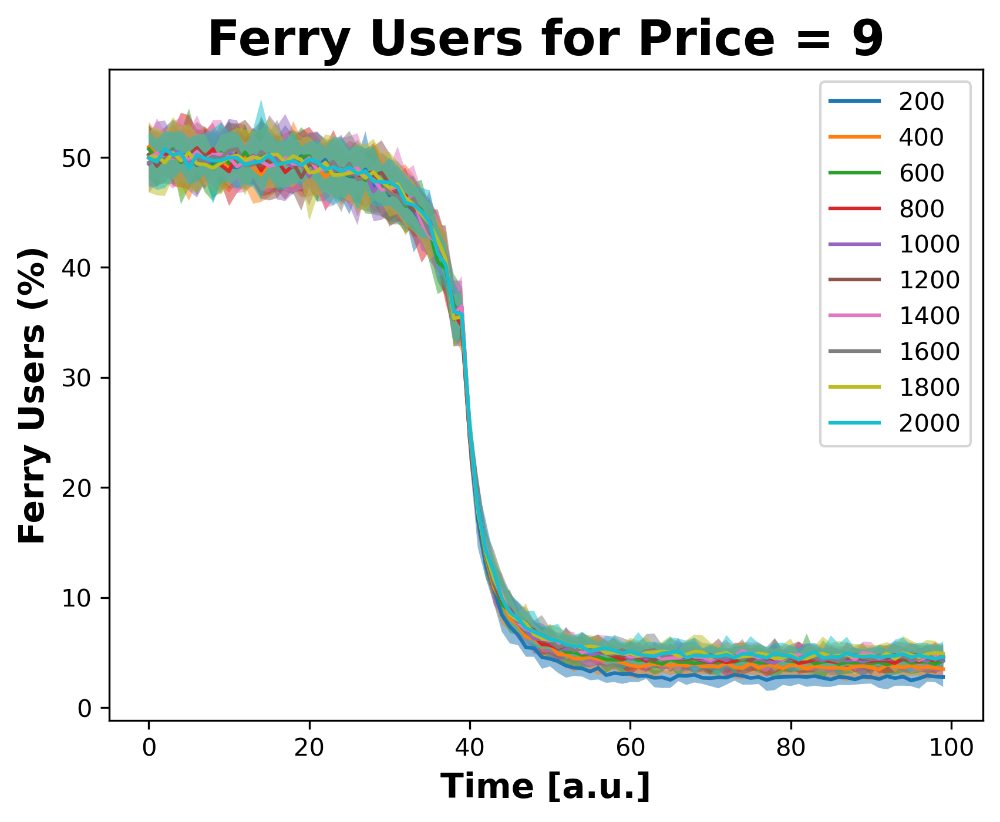

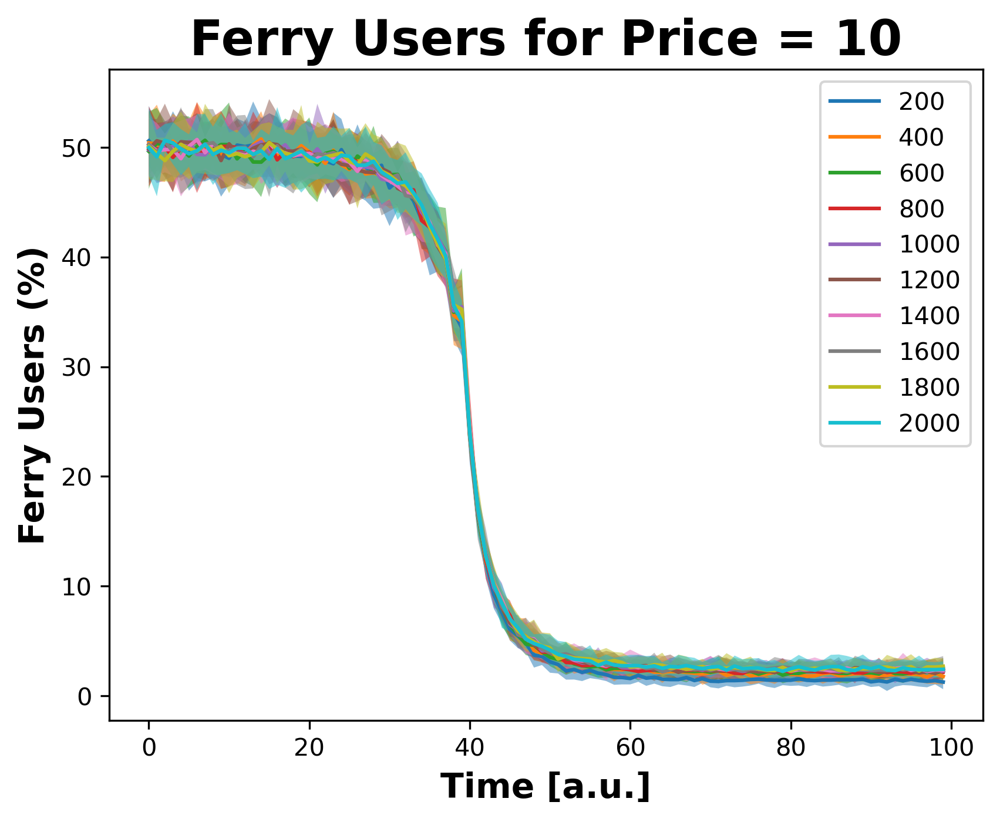

In [18]:
for price_ix, ferry_base_price in enumerate(prices):
    plt.figure(dpi=300)
    for capacity_ix, capacity in enumerate(capacities):
        plt.plot(mean[capacity_ix, price_ix]*100, label=capacity)
        plt.fill_between(np.arange(0, num_days, 1), CI[capacity_ix, price_ix, :, 0]*100, CI[capacity_ix, price_ix, :, 1]*100, alpha=0.5)
    plt.title(f'Ferry Users for Price = {ferry_base_price}', fontsize=20, fontweight='bold')
    plt.legend()
    plt.xlabel('Time [a.u.]', fontsize=14, fontweight='bold')
    plt.ylabel('Ferry Users (%)', fontsize=14, fontweight='bold')
    # plt.savefig(f'Figures3/Percentage of ferry users in time for price = {ferry_base_price}')
    plt.show()

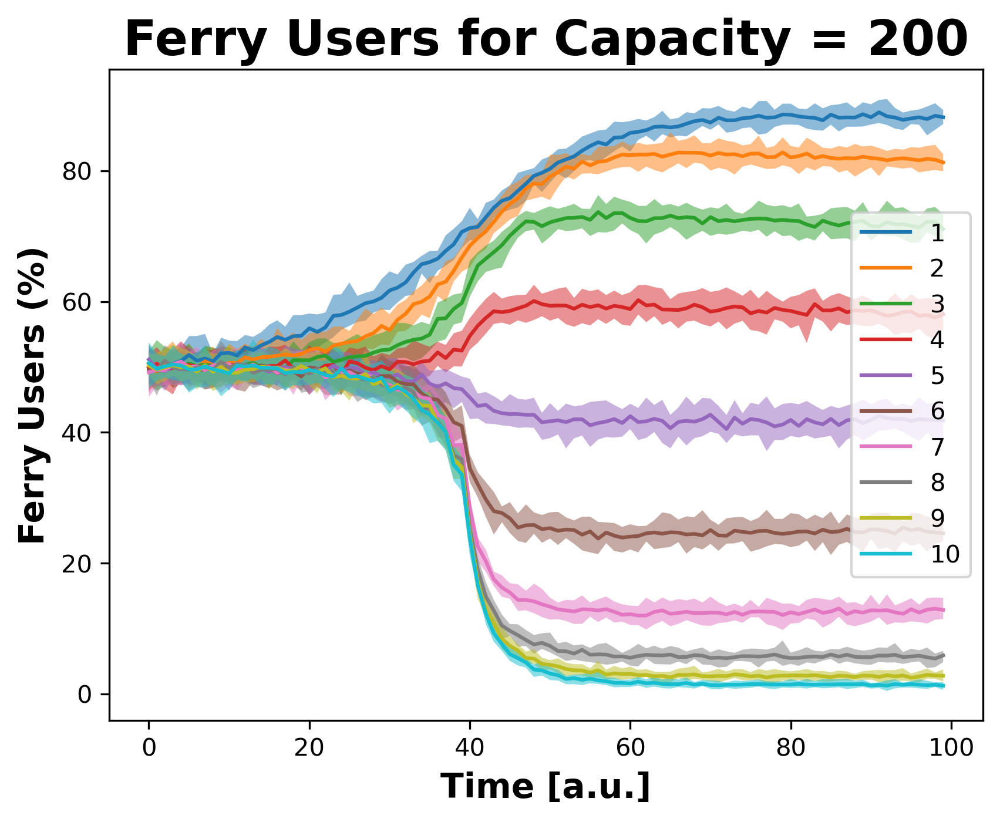

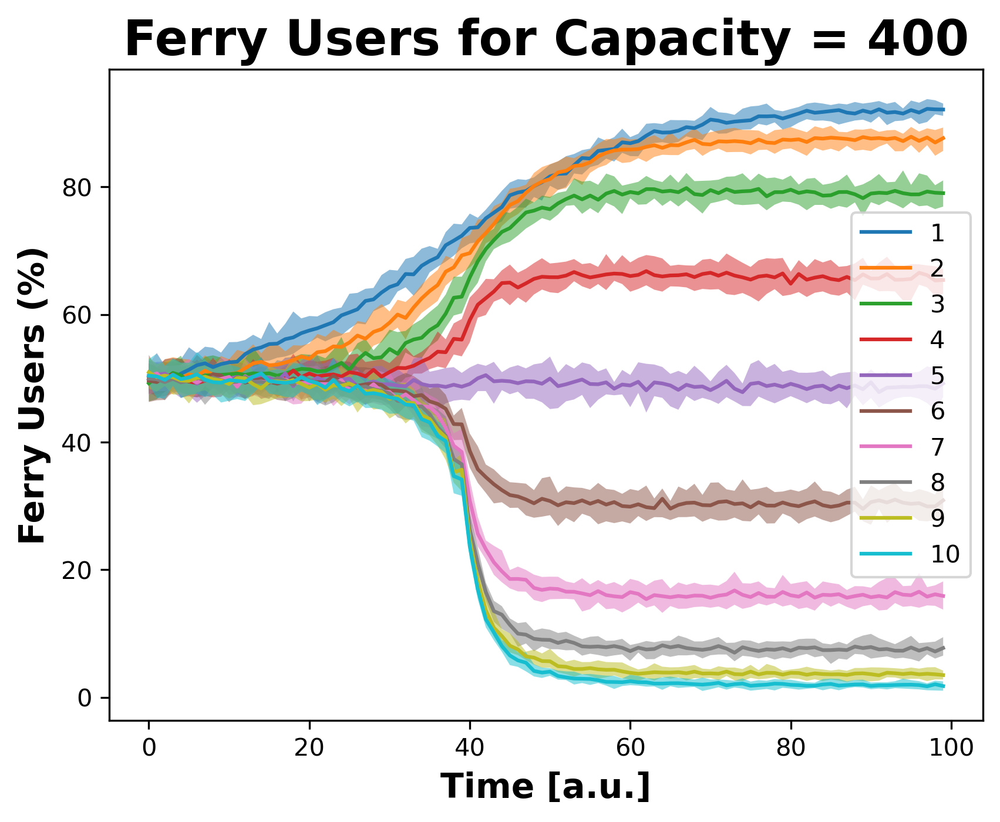

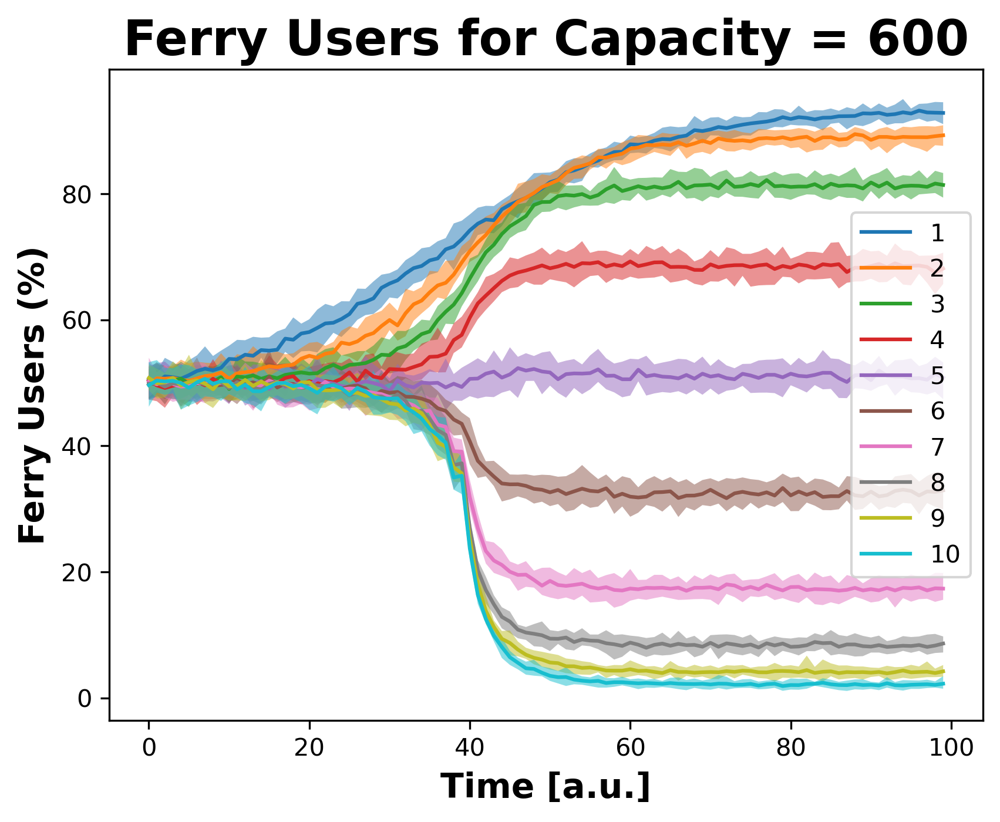

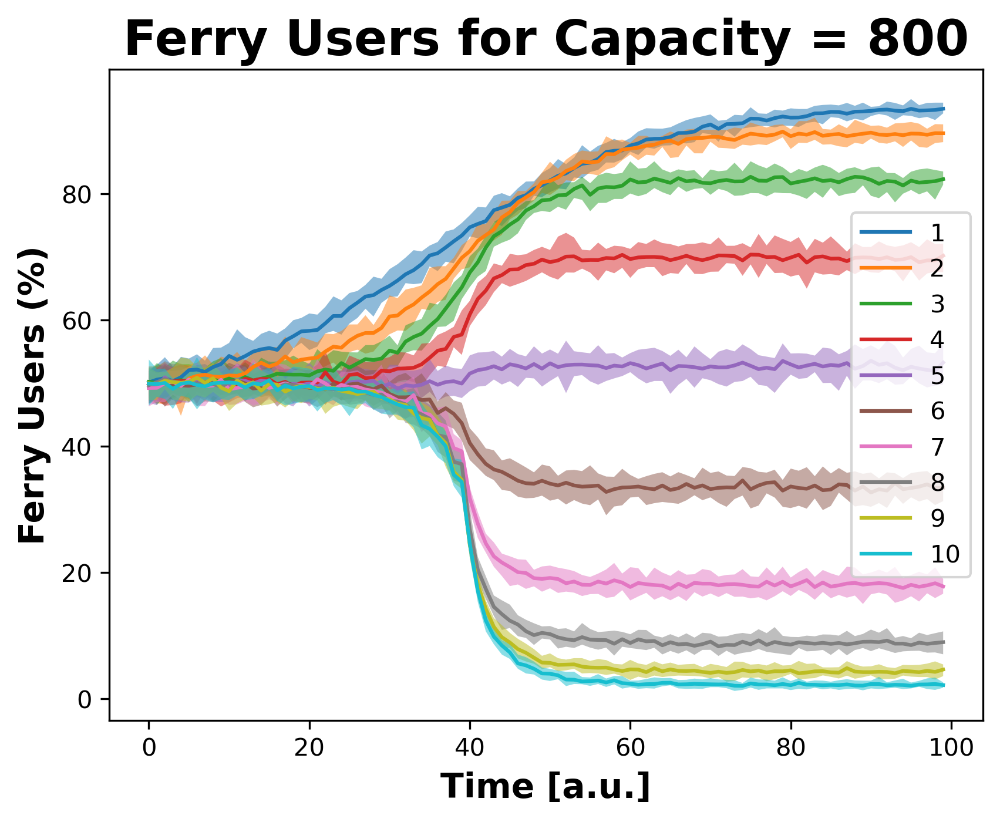

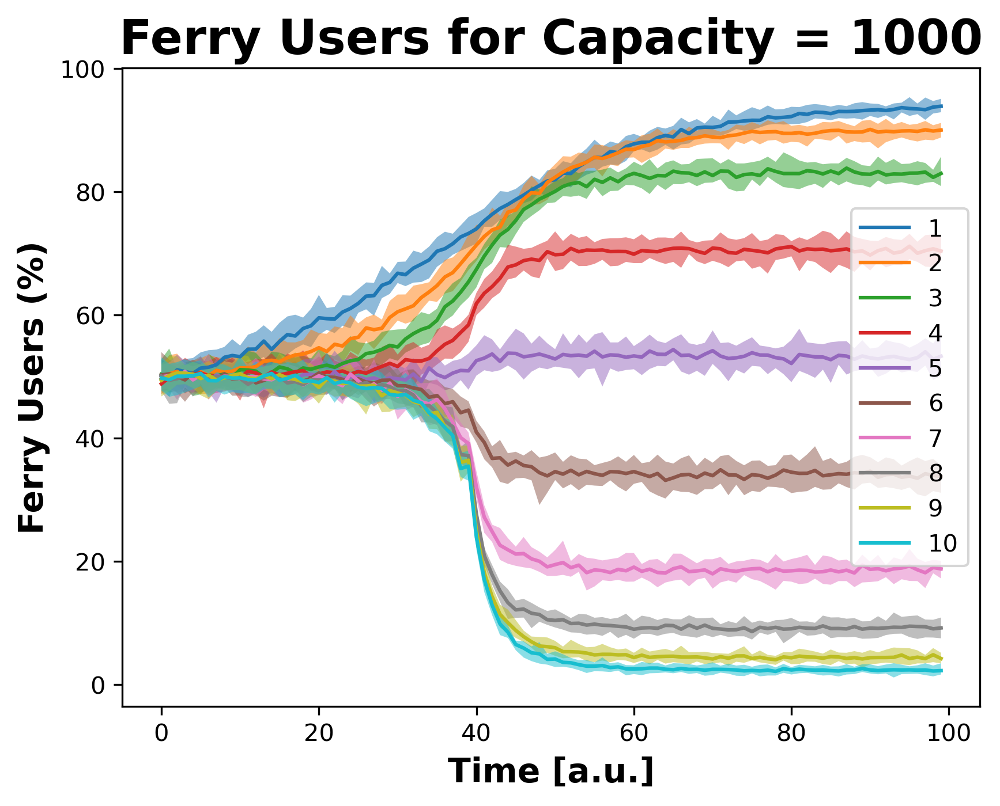

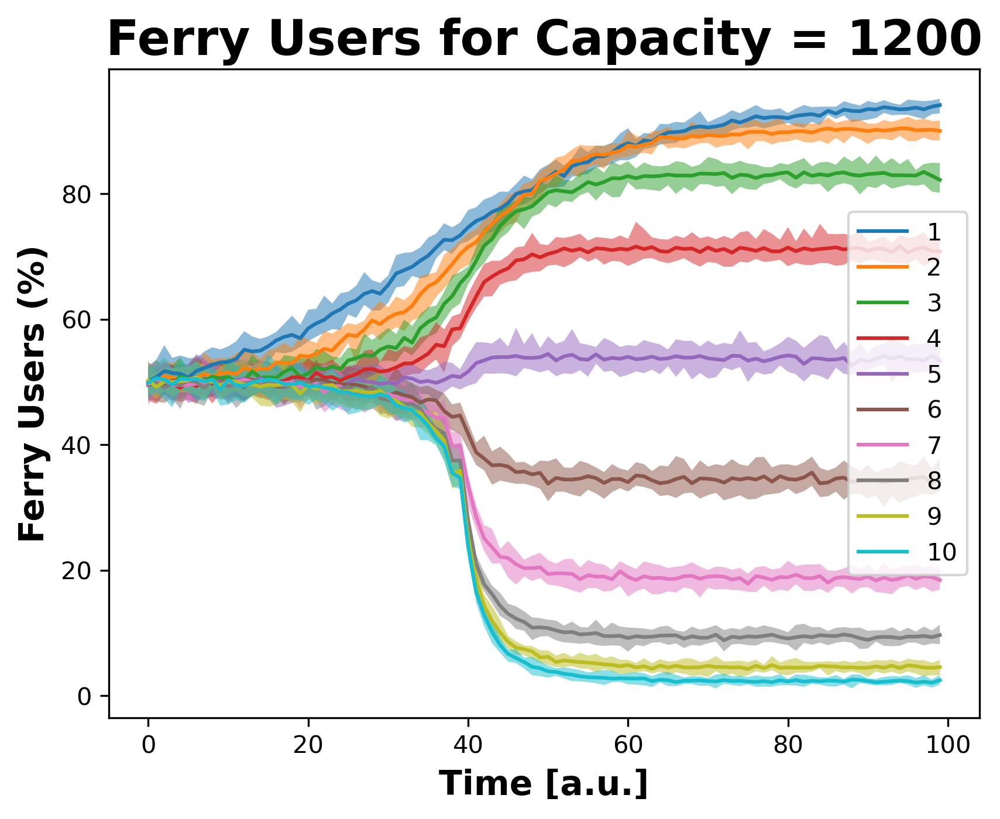

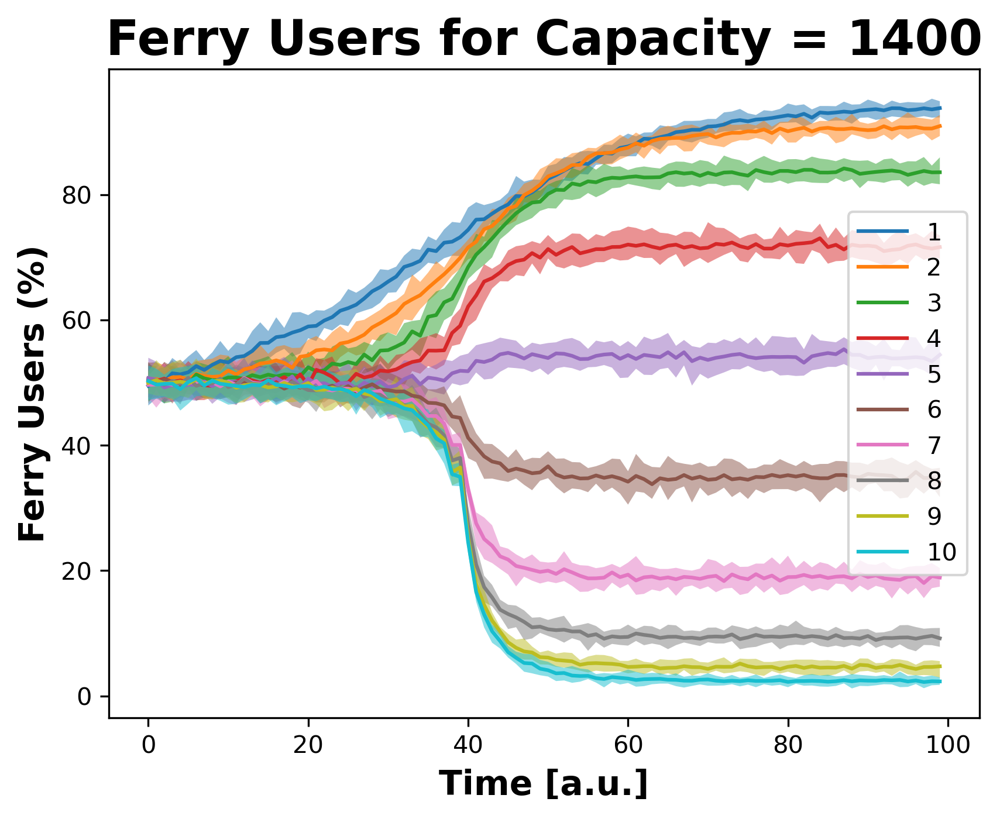

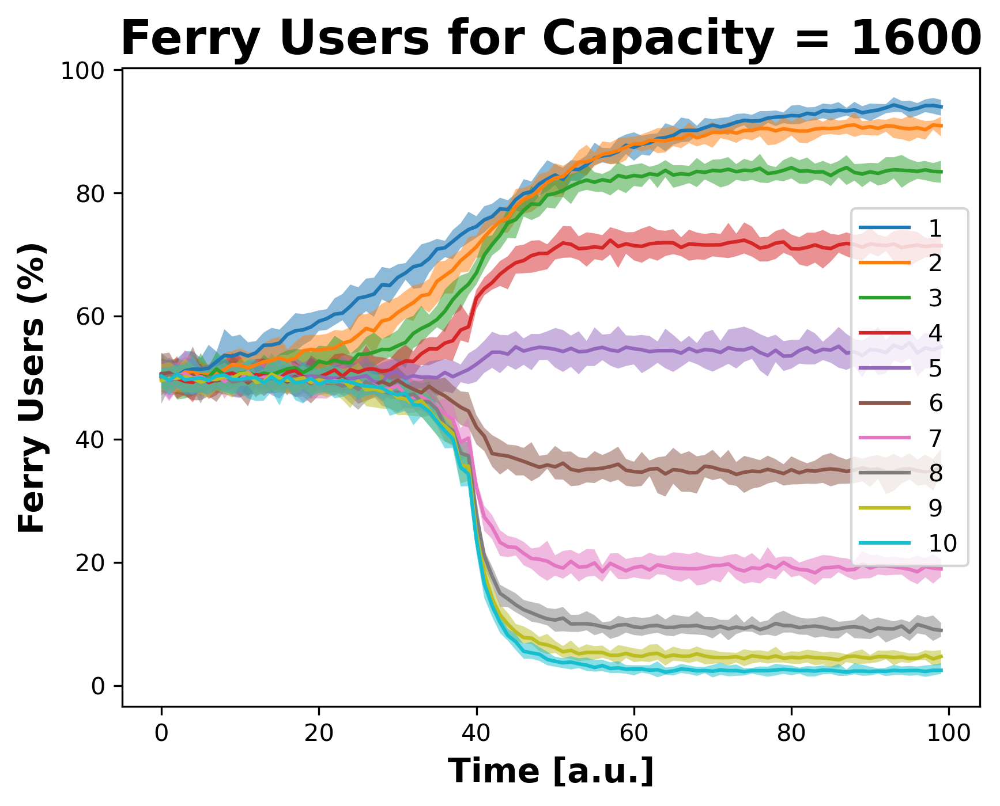

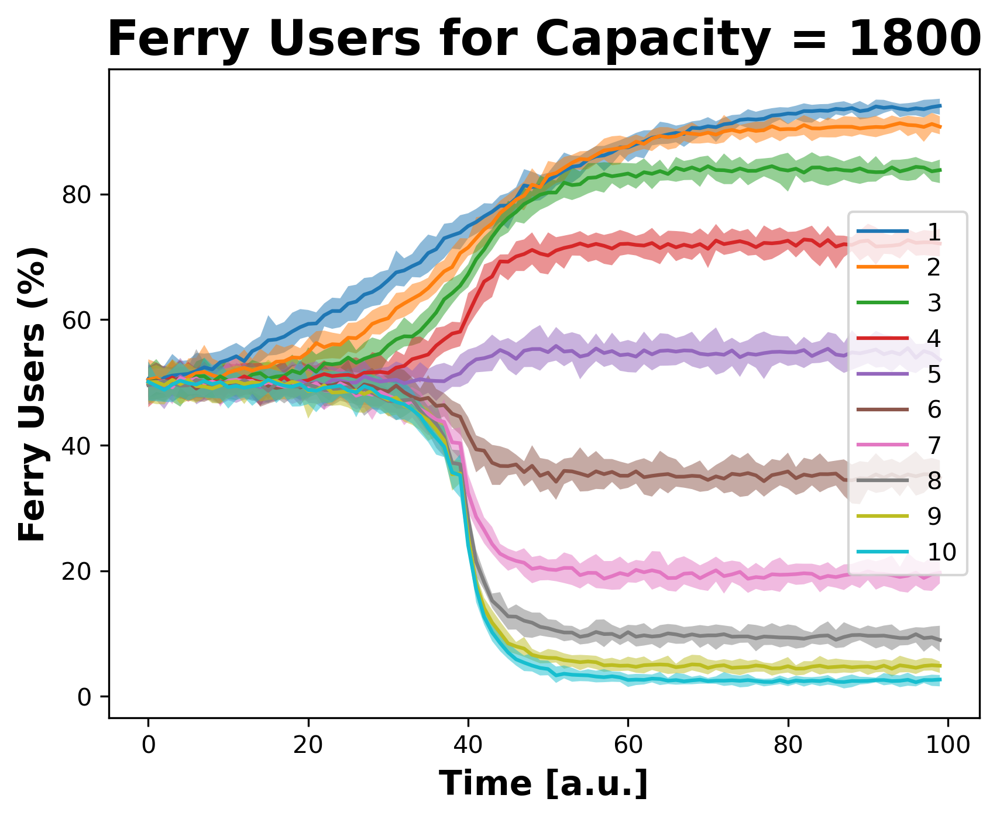

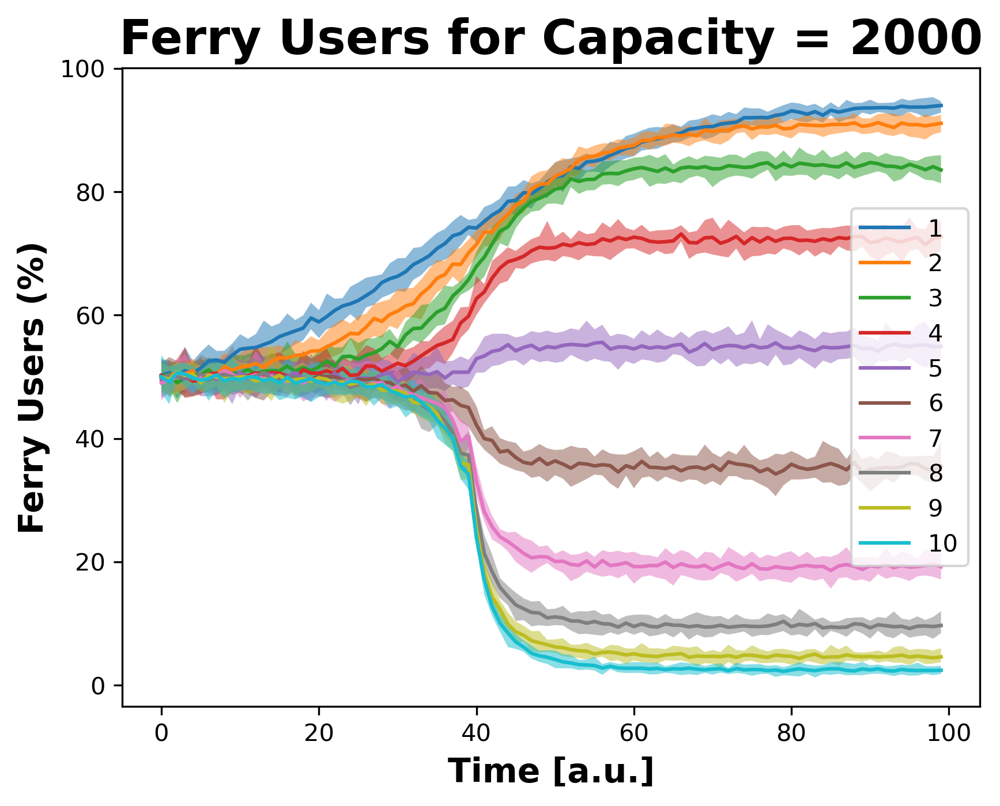

In [19]:
for capacity_ix, capacity in enumerate(capacities):
    plt.figure(dpi=300)
    for price_ix, ferry_base_price in enumerate(prices):
        plt.plot(mean[capacity_ix, price_ix]*100, label=ferry_base_price)
        plt.fill_between(np.arange(0, num_days, 1), CI[capacity_ix, price_ix, :, 0]*100, CI[capacity_ix, price_ix, :, 1]*100, alpha=0.5)
    plt.title(f'Ferry Users for Capacity = {capacity}', fontsize=20, fontweight='bold')
    plt.legend()
    plt.xlabel('Time [a.u.]', fontsize=14, fontweight='bold')
    plt.ylabel('Ferry Users (%)', fontsize=14, fontweight='bold')
    # plt.savefig(f'Figures3/Percentage of ferry users in time for capacity = {capacity}')
    plt.show()

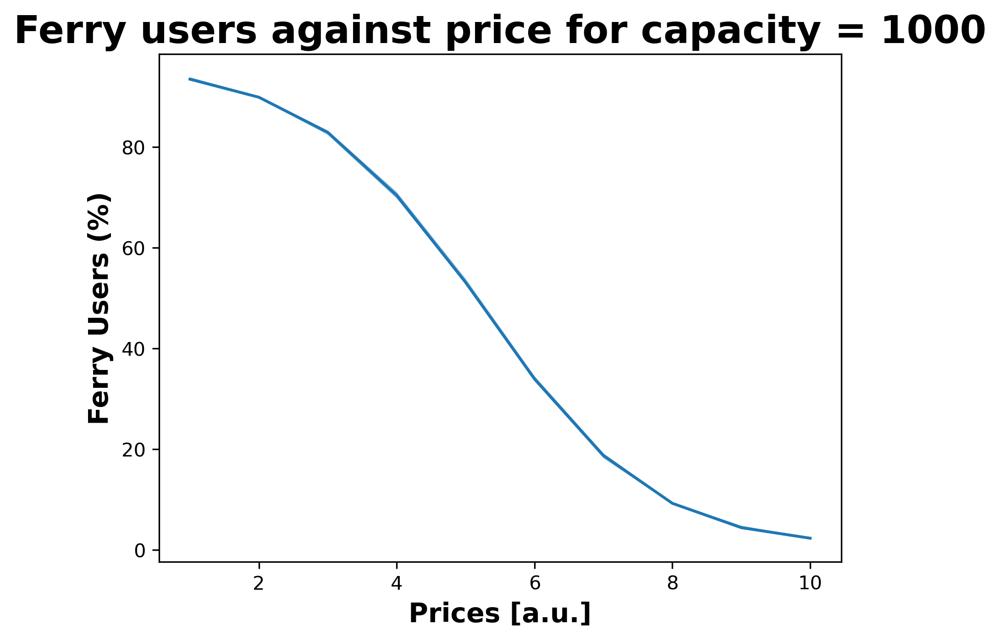

In [20]:
plt.figure(dpi=300)
capacity_ix = 4
plt.plot(prices, mean_mean[capacity_ix, :]*100)
plt.fill_between(prices, CI_mean[capacity_ix, :, 0]*100, CI_mean[capacity_ix, :, 1]*100, alpha=0.5)
plt.title('Ferry users against price for capacity = 1000', fontsize=20, fontweight='bold')
plt.xlabel('Prices [a.u.]', fontsize=14, fontweight='bold')
plt.ylabel('Ferry Users (%)', fontsize=14, fontweight='bold')
# plt.savefig('Figures3/Ferry users agains price for capacity = 1000')
plt.show()

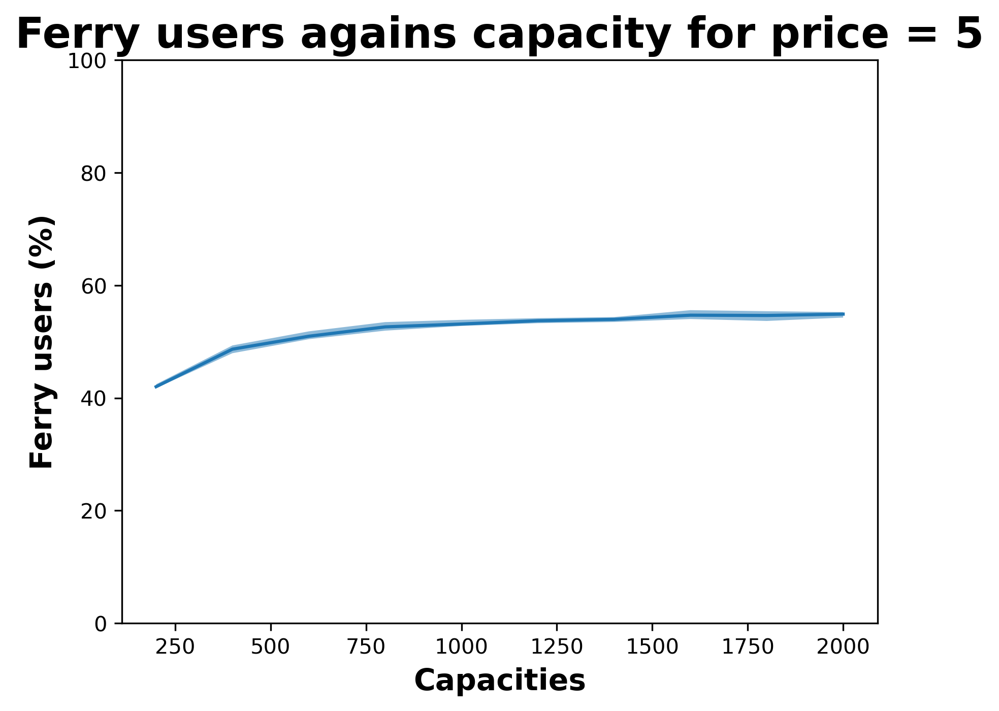

In [21]:
plt.figure(dpi=300)
price_ix = 4
plt.plot(capacities, mean_mean[:, price_ix]*100)
plt.fill_between(capacities, CI_mean[:, price_ix, 0]*100, CI_mean[:, price_ix, 1]*100, alpha=0.5)
plt.title('Ferry users agains capacity for price = 5', fontsize=20, fontweight='bold')
plt.xlabel('Capacities', fontsize=14, fontweight='bold')
plt.ylabel('Ferry users (%)', fontsize=14, fontweight='bold')
plt.ylim((0, 100))
# plt.savefig('Figures3/Ferry users agains capacity for price = 5')
plt.show() 

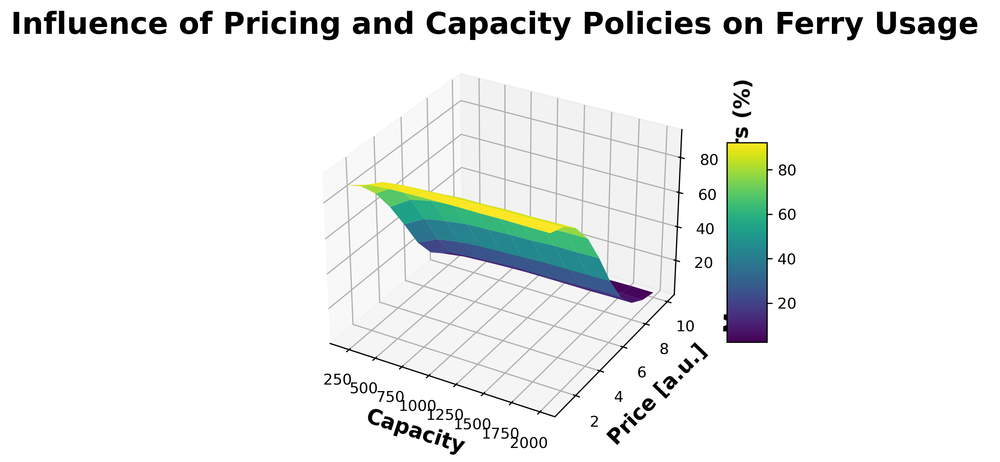

In [22]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(dpi=300)
ax = fig.add_subplot(111, projection='3d')

# Create meshgrid for capacities and prices
X, Y = np.meshgrid(capacities, prices)
Z = mean_mean.T  # Transpose to match the meshgrid dimensions

# Plot the surface
surf = ax.plot_surface(X, Y, Z*100, cmap='viridis', edgecolor='none')

# Add labels and title
ax.set_xlabel('Capacity', fontsize=14, fontweight='bold')
ax.set_ylabel('Price [a.u.]', fontsize=14, fontweight='bold')
ax.set_zlabel('Mean Ferry Users (%)', fontsize=14, fontweight='bold')
ax.set_title('Influence of Pricing and Capacity Policies on Ferry Usage ', fontsize=20, fontweight='bold')


# Add a color bar
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5)

# plt.savefig('Figures3/3D Surface Plot of Mean Percentage of Ferry Users')
plt.show()

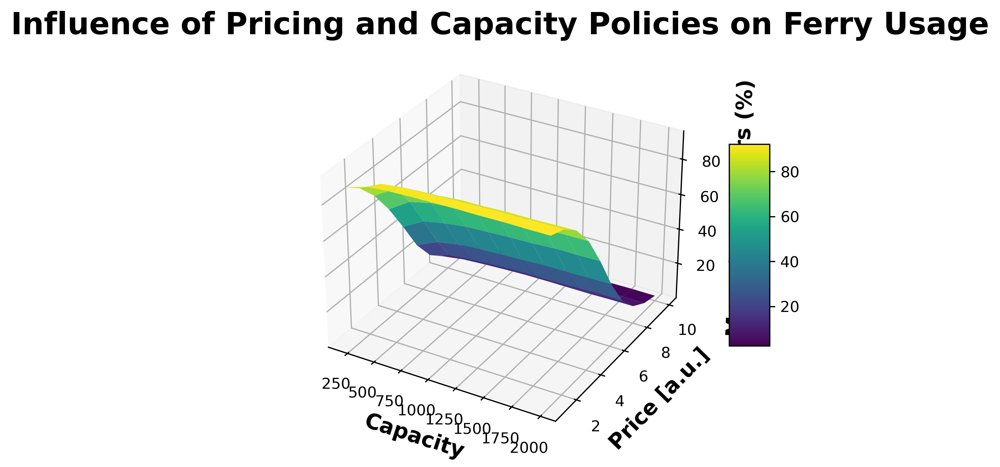

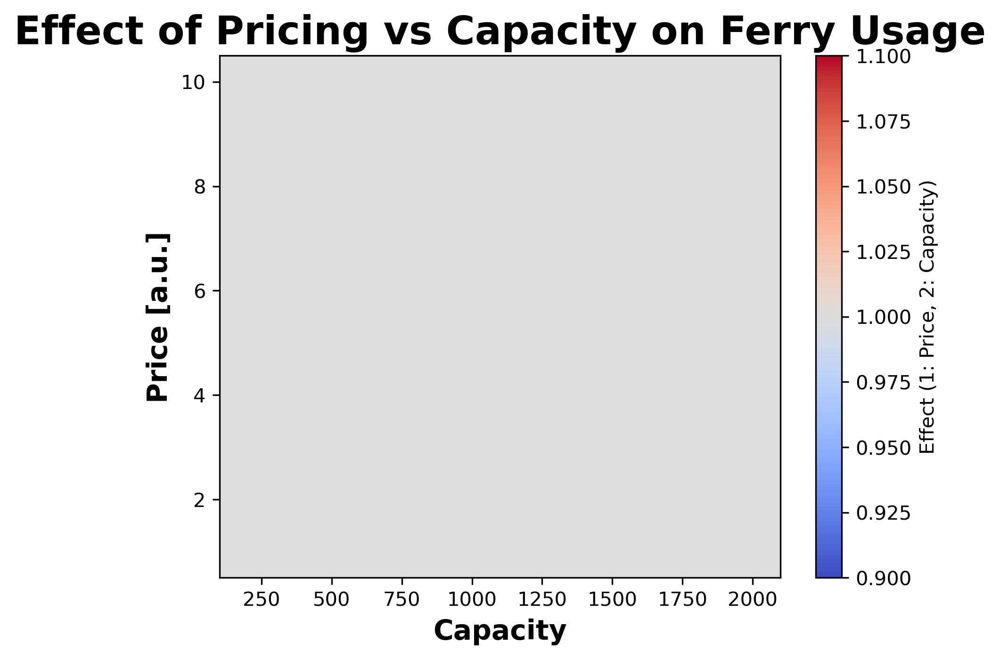

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Assuming mean_mean is already defined and contains the dependent variable values

# Calculate the partial derivatives
dZ_dX = np.gradient(mean_mean, axis=0)  # Partial derivative with respect to capacity
dZ_dY = np.gradient(mean_mean, axis=1)  # Partial derivative with respect to price

# Determine the effect at each point
effect = np.zeros_like(mean_mean)
effect[dZ_dX > dZ_dY] = 1  # Price has a greater effect
effect[dZ_dX <= dZ_dY] = 2  # Capacity has a greater effect

# Create meshgrid for capacities and prices
X, Y = np.meshgrid(capacities, prices)
Z = mean_mean.T  # Transpose to match the meshgrid dimensions

# Plot the surface
fig = plt.figure(dpi=300)
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(X, Y, Z*100, cmap='viridis', edgecolor='none')

# Add labels and title
ax.set_xlabel('Capacity', fontsize=14, fontweight='bold')
ax.set_ylabel('Price [a.u.]', fontsize=14, fontweight='bold')
ax.set_zlabel('Mean Ferry Users (%)', fontsize=14, fontweight='bold')
ax.set_title('Influence of Pricing and Capacity Policies on Ferry Usage', fontsize=20, fontweight='bold')

# Add a color bar
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5)

# plt.savefig('Figures3/3D_Surface_Plot_of_Mean_Percentage_of_Ferry_Users.png')
plt.show()

# Plot the effect
fig, ax = plt.subplots(dpi=300)
c = ax.pcolormesh(X, Y, effect.T, cmap='coolwarm', shading='auto')
ax.set_xlabel('Capacity', fontsize=14, fontweight='bold')
ax.set_ylabel('Price [a.u.]', fontsize=14, fontweight='bold')
ax.set_title('Effect of Pricing vs Capacity on Ferry Usage', fontsize=20, fontweight='bold')
fig.colorbar(c, ax=ax, label='Effect (1: Price, 2: Capacity)')

# plt.savefig('Figures3/Effect_of_Pricing_vs_Capacity_on_Ferry_Usage.png')
plt.show()